In [1]:
# Import the necessary modules
%matplotlib inline
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
from matplotlib.ticker import ScalarFormatter
import probscale
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error
from sklearn.model_selection import train_test_split

In [2]:
# Read the dataset
data = pd.read_csv('data.csv', sep=';', na_values=-99)
data.head()

,x,y,z,au_ppm,lenau,cu_pct,lencu,as_ppm,lenas,lit,mnz,alt,dhid
0,22997.607,33352.743,4206.375,NaN,0.000,NaN,0.000,NaN,0.0,20,2,500,1
1,22997.607,33350.936,4202.500,0.160,0.951,0.015,0.951,NaN,0.0,20,2,500,1
2,22997.607,33348.604,4197.500,0.435,5.517,0.018,5.517,NaN,0.0,20,2,500,1
3,22997.607,33346.273,4192.500,0.188,5.517,0.028,5.517,NaN,0.0,20,2,500,1
4,22997.607,33343.941,4187.500,0.190,5.517,0.017,5.517,NaN,0.0,20,2,500,1


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16901 entries, 0 to 16900
Data columns (total 13 columns):
 #   Column  Non-Null Count  Dtype  
---  ------  --------------  -----  
 0   x       16901 non-null  float64
 1   y       16901 non-null  float64
 2   z       16901 non-null  float64
 3   au_ppm  16224 non-null  float64
 4   lenau   16901 non-null  float64
 5   cu_pct  16069 non-null  float64
 6   lencu   16901 non-null  float64
 7   as_ppm  9865 non-null   float64
 8   lenas   16901 non-null  float64
 9   lit     16901 non-null  int64  
 10  mnz     16901 non-null  int64  
 11  alt     16901 non-null  int64  
 12  dhid    16901 non-null  int64  
dtypes: float64(9), int64(4)
memory usage: 1.7 MB


In [4]:
# Map categories and create new columns
mapp_alt = {100:'GRA',200:'POT',300:'IAR',400:'ARG',500:'PHY'}
mapp_lito = {100:'GRA',20:'RWA',30:'POF',40:'POB',50:'POA',60:'POE',70:'CBR'}
mapp_mine = {100:'GRA',2:'LEA',3:'OXI',4:'SEC',5:'PRI'}

data['alte'] = data.alt.replace(mapp_alt)
data['lito'] = data.lit.replace(mapp_lito)
data['mine'] = data.mnz.replace(mapp_mine)

# Set Dtype
data['mine'] = data.mine.astype('category')
data['lito'] = data.lito.astype('category')
data['alte'] = data.alte.astype('category')

In [5]:
# Drop columns 
drop = 'lenau lencu lenas lit mnz alt'.split(' ')
data = data.drop(drop, axis=1)

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 16901 entries, 0 to 16900
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   x       16901 non-null  float64 
 1   y       16901 non-null  float64 
 2   z       16901 non-null  float64 
 3   au_ppm  16224 non-null  float64 
 4   cu_pct  16069 non-null  float64 
 5   as_ppm  9865 non-null   float64 
 6   dhid    16901 non-null  int64   
 7   alte    16901 non-null  category
 8   lito    16901 non-null  category
 9   mine    16901 non-null  category
dtypes: category(3), float64(6), int64(1)
memory usage: 974.7 KB


As we can see, there are NaN values in the Cu, Au and As columns. This will be discussed later, because their possible value depends on multiple variables and spatial relationships.

# Exploratory Data Analysis

In [6]:
# Descriptive statistics 
data.describe().T

,count,mean,std,min,25%,50%,75%,max
x,16901.0,23395.794875,317.011009,21900.779,23251.655,23393.406,23558.238,24791.718
y,16901.0,33099.325519,327.035152,31398.845,32911.448,33085.120,33278.781,34042.849
z,16901.0,3880.979863,180.229406,3064.720,3777.500,3907.500,4012.500,4251.528
au_ppm,16224.0,0.381403,0.426844,0.005,0.081,0.275,0.550,18.085
cu_pct,16069.0,0.371081,0.424502,0.000,0.034,0.267,0.579,7.927
as_ppm,9865.0,49.968282,151.684030,5.000,5.070,16.354,41.545,5205.241
dhid,16901.0,108.111295,62.773569,1.000,58.000,105.000,150.000,268.000


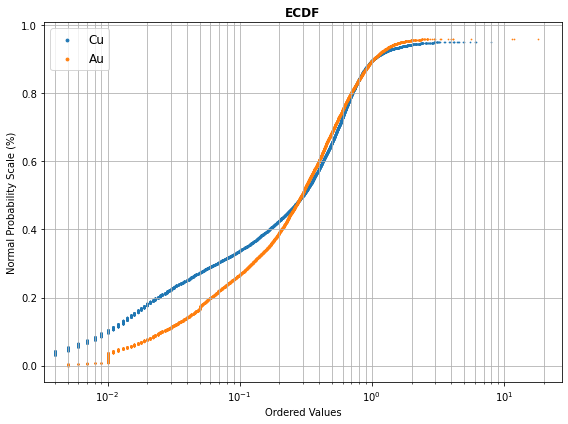

In [7]:
# ECDF function of Cu and Au continuous variables
def ecdf(data):
    """Compute ECDF for a one-dimensional array of measurements."""
    # Number of data points: n
    n = len(data)

    # x-data for the ECDF: x
    x = np.sort(data)

    # y-data for the ECDF: y
    y = np.arange(1, n+1) / n

    return x, y

# Generate the distribution
x_cu, y_cu = ecdf(data.cu_pct)
x_au, y_au = ecdf(data.au_ppm)

# Generate the plot
fig, ax = plt.subplots(figsize=(8,6))

ax.scatter(x_cu, y_cu, marker='.', label='Cu', s=2)
ax.scatter(x_au, y_au, marker='.', label='Au', s=2)

ax.set_xscale('log')
ax.grid(which='both') 
ax.legend(fontsize=12, markerscale=4)
ax.set_title('ECDF', weight='bold')
ax.set_xlabel('Ordered Values')
ax.set_ylabel('Normal Probability Scale (%)')

plt.tight_layout()
plt.show()

In [8]:
# Scatter 3D of Cu and Au
variable = 'cu_pct'
quantile = data[variable].quantile(0.99)

fig = px.scatter_3d(data, x='x',y='y',z='z', color=variable, color_continuous_scale=px.colors.sequential.Jet,
                    range_color=[0,quantile])
fig.update_traces(marker=dict(size=4))
fig.show()

variable = 'au_ppm'
quantile = data[variable].quantile(0.99)

fig = px.scatter_3d(data, x='x',y='y',z='z', color=variable, color_continuous_scale=px.colors.sequential.Jet,
                    range_color=[0,quantile])
fig.update_traces(marker=dict(size=5))
fig.show()

In [9]:
categorical = 'mine'
fig = px.scatter_3d(data, x='x', y='y', z='z', color=categorical)
fig.update_traces(marker=dict(size=4))
fig.show()

categorical = 'lito'
fig = px.scatter_3d(data, x='x', y='y', z='z', color=categorical)
fig.update_traces(marker=dict(size=4))
fig.show()

categorical = 'alte'
fig = px.scatter_3d(data, x='x', y='y', z='z', color=categorical)
fig.update_traces(marker=dict(size=4))
fig.show()

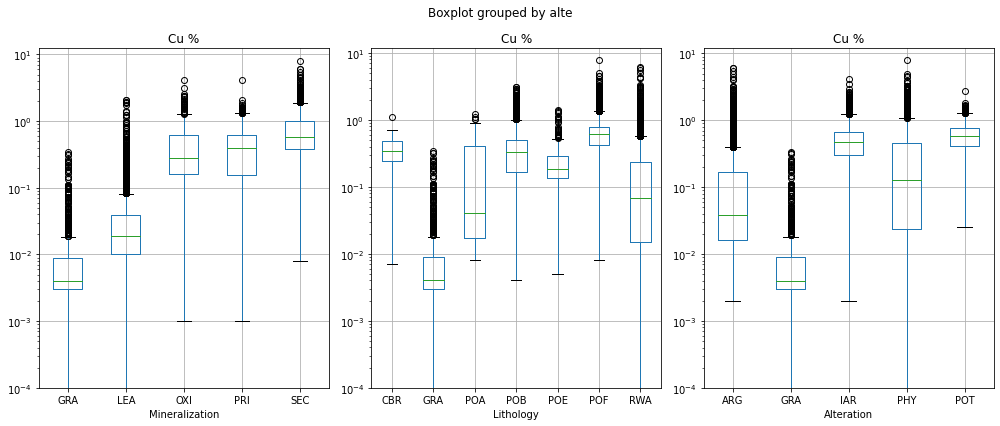

In [10]:
# Boxplots by categories
fig, ax = plt.subplots(1,3,figsize=(14,6))

tupl = (('mine', 0, 'Mineralization'), ('lito', 1, 'Lithology'), ('alte', 2, 'Alteration'))
variable = 'cu_pct'

for i,j,k in tupl:
    data.boxplot(variable, i, ax=ax[j])
    ax[j].set_yscale('log')
    ax[j].set_title('Cu %')
    ax[j].set_xlabel(k)
    ax[j].set_yticks([0.0001,0.001,0.01,0.1,1,10])
    
plt.tight_layout()   

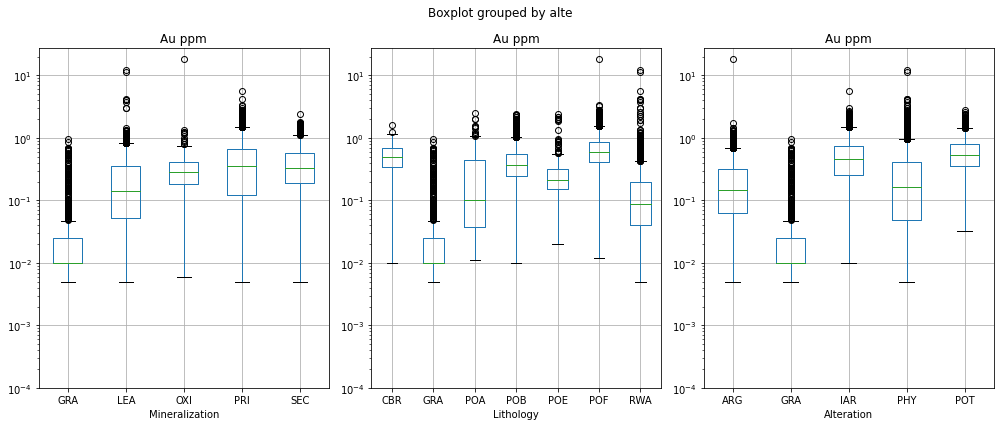

In [11]:
# Boxplots by categories
fig, ax = plt.subplots(1,3,figsize=(14,6))

tupl = (('mine', 0, 'Mineralization'), ('lito', 1, 'Lithology'), ('alte', 2, 'Alteration'))
variable = 'au_ppm'

for i,j,k in tupl:
    data.boxplot(variable, i, ax=ax[j])
    ax[j].set_yscale('log')
    ax[j].set_title('Au ppm')
    ax[j].set_xlabel(k)
    ax[j].set_yticks([0.0001,0.001,0.01,0.1,1,10])

plt.tight_layout()

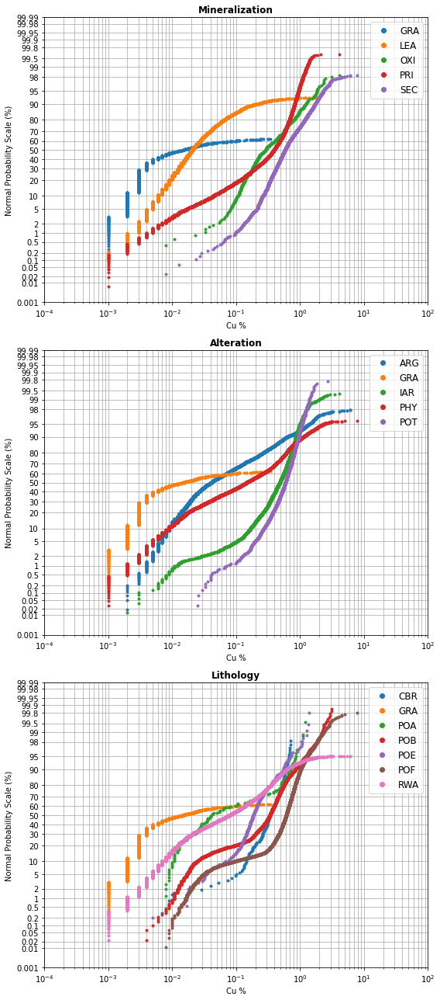

In [12]:
fig, ax = plt.subplots(3,1,figsize=(8,18))

categories = (('mine', 0, 'Mineralization'), ('alte', 1, 'Alteration'), ('lito', 2, 'Lithology'))
variable = 'cu_pct'

for n,j,k in categories:
    for i in data.groupby(n).groups.keys():
        _ = data.groupby(n).get_group(i)[variable]
        probscale.probplot(_, probax='y', datascale='log', label=i, ax=ax[j], marker='.')
        ax[j].legend(fontsize=12, markerscale=2)
        ax[j].set_ylim(bottom=0.001, top=99.99)
        ax[j].set_xlim(left=1e-4, right=1e2)
        ax[j].set_xlabel('Cu %')
        ax[j].set_ylabel('Normal Probability Scale (%)')
        ax[j].grid(which='both', axis='both')
        ax[j].set_title(k, weight='bold')

plt.tight_layout()
plt.show() 

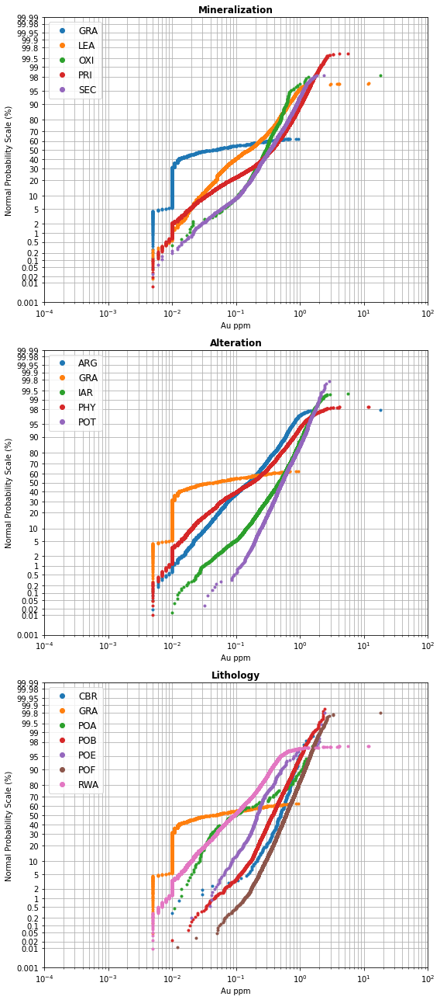

In [13]:
fig, ax = plt.subplots(3,1,figsize=(8,18))

categories = (('mine', 0, 'Mineralization'), ('alte', 1, 'Alteration'), ('lito', 2, 'Lithology'))
variable = 'au_ppm'

for n,j,k in categories:
    for i in data.groupby(n).groups.keys():
        _ = data.groupby(n).get_group(i)[variable]
        probscale.probplot(_, probax='y', datascale='log', label=i, ax=ax[j], marker='.')
        ax[j].legend(fontsize=12, markerscale=2)
        ax[j].set_ylim(bottom=0.001, top=99.99)
        ax[j].set_xlim(left=1e-4, right=1e2)
        ax[j].set_xlabel('Au ppm')
        ax[j].set_ylabel('Normal Probability Scale (%)')
        ax[j].grid(which='both', axis='both')
        ax[j].set_title(k, weight='bold')

plt.tight_layout()
plt.show()  

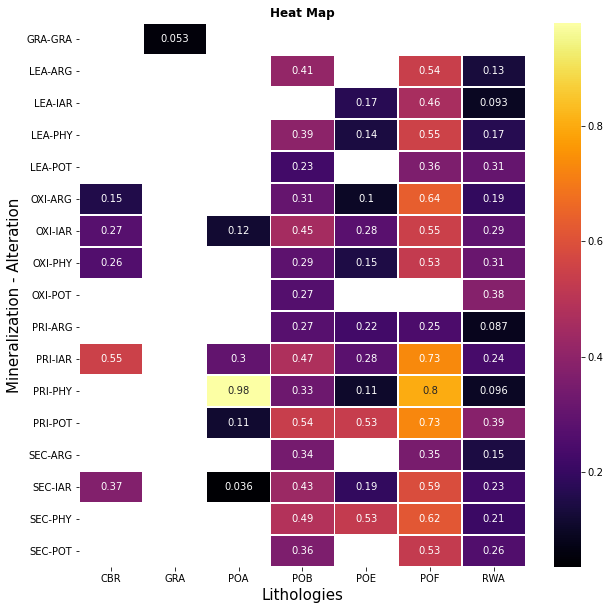

In [14]:
# Make a pivot table
variable = 'au_ppm'
table = pd.pivot_table(data, values=variable, index=['mine', 'alte'], columns='lito', aggfunc=np.mean)

# Generate a heatmap from table
fig, ax = plt.subplots(figsize=(10,10))

sns.heatmap(table, cmap='inferno',annot=True, linewidths=.5, ax=ax)
ax.set_xlabel('Lithologies', fontsize=15)
ax.set_ylabel('Mineralization - Alteration', fontsize=15)
ax.set_title('Heat Map', weight='bold')

plt.show()

# Linear regression
Linear regression is a good option for estimating one variable with respect to another; the better the fit, the better the estimation results.

In the following we will deal with a simple approach, without considering further divisions of the database (based on domains) that are necessary to obtain better results.

In [15]:
# Select the samples with PRI mineralization
pri = data[data['mine'] == 'PRI']
pri.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8999 entries, 53 to 16900
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   x       8999 non-null   float64 
 1   y       8999 non-null   float64 
 2   z       8999 non-null   float64 
 3   au_ppm  8969 non-null   float64 
 4   cu_pct  8967 non-null   float64 
 5   as_ppm  4976 non-null   float64 
 6   dhid    8999 non-null   int64   
 7   alte    8999 non-null   category
 8   lito    8999 non-null   category
 9   mine    8999 non-null   category
dtypes: category(3), float64(6), int64(1)
memory usage: 589.6 KB


As is the variable with the most NaN values. Here we are going to use the mean.

In [16]:
# Fill NaN values with the mean
pri_filled = pri.fillna(pri.mean())
pri_filled.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 8999 entries, 53 to 16900
Data columns (total 10 columns):
 #   Column  Non-Null Count  Dtype   
---  ------  --------------  -----   
 0   x       8999 non-null   float64 
 1   y       8999 non-null   float64 
 2   z       8999 non-null   float64 
 3   au_ppm  8999 non-null   float64 
 4   cu_pct  8999 non-null   float64 
 5   as_ppm  8999 non-null   float64 
 6   dhid    8999 non-null   int64   
 7   alte    8999 non-null   category
 8   lito    8999 non-null   category
 9   mine    8999 non-null   category
dtypes: category(3), float64(6), int64(1)
memory usage: 589.6 KB


In [17]:
# Correlation coefficient 
pri_filled[['cu_pct','au_ppm','as_ppm']].corr()

,cu_pct,au_ppm,as_ppm
cu_pct,1.000000,0.820453,0.151469
au_ppm,0.820453,1.000000,0.001109
as_ppm,0.151469,0.001109,1.000000


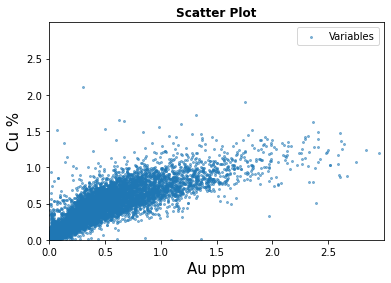

In [18]:
# Scatter plot Au/Cu
au = pri_filled.au_ppm
cu = pri_filled.cu_pct

fig, ax = plt.subplots()

ax.scatter(au,cu, marker='o', alpha=0.5, s=4, label='Variables')
ax.margins(0.02)
ax.set_xlabel('Au ppm', fontsize=15)
ax.set_ylabel('Cu %', fontsize=15)
ax.set_xticks(np.arange(0,3,0.5))
ax.set_yticks(np.arange(0,3,0.5))
ax.set_xlim((0,3))
ax.set_ylim((0,3))
ax.set_title('Scatter Plot', weight='bold')

plt.legend()
plt.show()

In [19]:
# Preparing the data
X = pri_filled['au_ppm'].values.reshape(-1,1)
y = pri_filled['cu_pct']
X.shape, y.shape

((8999, 1), (8999,))

In [20]:
# Create a training and test sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.3, random_state=42)

# Create the regressor: reg_all
reg = LinearRegression()

#Fit the regressor to the training data
reg.fit(X_train, y_train)

# Predict on the test data: y_pred
y_pred = reg .predict(X_test)

# Compute and print R^2 and RMSE
print("R^2: {}".format(reg.score(X_test, y_test)))
rmse = np.sqrt(mean_squared_error(y_test,y_pred))
print("Root Mean Squared Error: {}".format(rmse))

R^2: 0.6980479128223643
Root Mean Squared Error: 0.16242228841188852


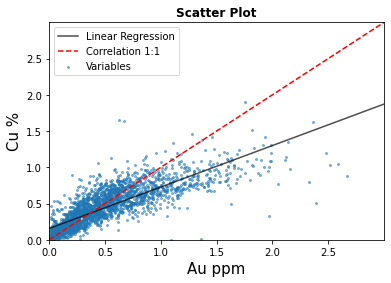

In [21]:
# Scatter plot 
fig, ax = plt.subplots()

ax.scatter(X_test, y_test, marker='o', alpha=0.5, s=4, label='Variables')

# Plot the line of best fit
fx = np.array([X_train.min(), (X_train.max())])
fy = reg.intercept_ + reg.coef_ * fx # y=n+mx ecuación de la recta
ax.plot(fx, fy, '-', alpha=0.7, color='black', linewidth=1.5, label='Linear Regression')
ax.plot(np.arange(0,4), np.arange(0,4), '--', color='red', linewidth=1.5, label='Correlation 1:1')

ax.margins(0.02)
ax.set_xlabel('Au ppm', fontsize=15)
ax.set_ylabel('Cu %', fontsize=15)
ax.set_xticks(np.arange(0,3,0.5))
ax.set_yticks(np.arange(0,3,0.5))
ax.set_xlim((0,3))
ax.set_ylim((0,3))
ax.set_title('Scatter Plot', weight='bold')

plt.legend()
plt.show()